[Flights Chalenge](https://github.com/MicrosoftDocs/ml-basics/blob/master/challenges/01%20-%20Flights%20Challenge.ipynb)

# Flights Data Exploration Challenge


In [2]:
import pandas as pd

df_flights = pd.read_csv('flights.csv')
df_flights.head()

,Year,Month,DayofMonth,DayOfWeek,Carrier,OriginAirportID,OriginAirportName,OriginCity,OriginState,DestAirportID,DestAirportName,DestCity,DestState,CRSDepTime,DepDelay,DepDel15,CRSArrTime,ArrDelay,ArrDel15,Cancelled
0,2013,9,16,1,DL,15304,Tampa International,Tampa,FL,12478,John F. Kennedy International,New York,NY,1539,4,0.0,1824,13,0,0
1,2013,9,23,1,WN,14122,Pittsburgh International,Pittsburgh,PA,13232,Chicago Midway International,Chicago,IL,710,3,0.0,740,22,1,0
2,2013,9,7,6,AS,14747,Seattle/Tacoma International,Seattle,WA,11278,Ronald Reagan Washington National,Washington,DC,810,-3,0.0,1614,-7,0,0
3,2013,7,22,1,OO,13930,Chicago O'Hare International,Chicago,IL,11042,Cleveland-Hopkins International,Cleveland,OH,804,35,1.0,1027,33,1,0
4,2013,5,16,4,DL,13931,Norfolk International,Norfolk,VA,10397,Hartsfield-Jackson Atlanta International,Atlanta,GA,545,-1,0.0,728,-9,0,0


In [4]:
len(df_flights.columns)
df_flights.shape

(271940, 20)

## Finding Missing Data

1. Start by cleaning the data.
    - Identify any null or missing data, and impute appropriate replacement values.
    - Identify and eliminate any outliers in the **DepDelay** and **ArrDelay** columns.

In [5]:
missing_data = df_flights.isnull().sum()
missing_data

Year                    0
Month                   0
DayofMonth              0
DayOfWeek               0
Carrier                 0
OriginAirportID         0
OriginAirportName       0
OriginCity              0
OriginState             0
DestAirportID           0
DestAirportName         0
DestCity                0
DestState               0
CRSDepTime              0
DepDelay                0
DepDel15             2761
CRSArrTime              0
ArrDelay                0
ArrDel15                0
Cancelled               0
dtype: int64

2761 data points are missing from the DepDel15 feature which indicates if departure is delayed by more than 15 minutes

In [7]:
missing_data=missing_data.to_frame()
missing_data=missing_data.rename(columns={0:'Empty Cells'})
print(missing_data)

                   Empty Cells
Year                         0
Month                        0
DayofMonth                   0
DayOfWeek                    0
Carrier                      0
OriginAirportID              0
OriginAirportName            0
OriginCity                   0
OriginState                  0
DestAirportID                0
DestAirportName              0
DestCity                     0
DestState                    0
CRSDepTime                   0
DepDelay                     0
DepDel15                  2761
CRSArrTime                   0
ArrDelay                     0
ArrDel15                     0
Cancelled                    0


## checking for zeros

In [18]:
df_flights.isnull().any(axis=1)

0         False
1         False
2         False
3         False
4         False
          ...  
271935    False
271936    False
271937    False
271938    False
271939    False
Length: 271940, dtype: bool

since only DepDel15 has missing value, lets describe the subset of dataset that has missing value, thus we are picking 2761 rows with NaN seen in DepDel15

In [21]:
df_flights[df_flights.isnull().any(axis=1)].describe()

,Year,Month,DayofMonth,DayOfWeek,OriginAirportID,DestAirportID,CRSDepTime,DepDelay,DepDel15,CRSArrTime,ArrDelay,ArrDel15,Cancelled
count,2761.0,2761.000000,2761.000000,2761.000000,2761.000000,2761.000000,2761.000000,2761.0,0.0,2761.000000,2761.0,2761.0,2761.0
mean,2013.0,6.455632,15.572619,3.604853,12757.763129,12708.952553,1431.354944,0.0,NaN,1587.419051,0.0,1.0,1.0
std,0.0,1.759942,8.092708,1.748487,1426.462196,1408.166022,457.450773,0.0,NaN,485.236232,0.0,0.0,0.0
min,2013.0,4.000000,1.000000,1.000000,10140.000000,10140.000000,5.000000,0.0,NaN,5.000000,0.0,1.0,1.0
25%,2013.0,5.000000,10.000000,2.000000,11298.000000,11298.000000,1050.000000,0.0,NaN,1229.000000,0.0,1.0,1.0
50%,2013.0,6.000000,16.000000,4.000000,12892.000000,12892.000000,1500.000000,0.0,NaN,1645.000000,0.0,1.0,1.0
75%,2013.0,8.000000,22.000000,5.000000,13930.000000,13930.000000,1815.000000,0.0,NaN,2003.000000,0.0,1.0,1.0
max,2013.0,10.000000,31.000000,7.000000,15376.000000,15376.000000,2359.000000,0.0,NaN,2359.000000,0.0,1.0,1.0


Appart from DepDel15, notice DepDelay has 0 as min, max and mode, but DepDel15 is same but has NaN instead. 
> **DepDelay** is the number of minutes depature was delayed
>
> **DepDel15** feature which indicates if departure is delayed by more than 15 minutes 
> 
> Since Since there is no delay showing 0 in DepDelay, there is no 15 minutes delay.
> 
> Replay all NaN in DepDel15 with 0.


In [22]:
df_flights.DepDel15 = df_flights.DepDel15.fillna(0)
df_flights.isnull().sum()

Year                 0
Month                0
DayofMonth           0
DayOfWeek            0
Carrier              0
OriginAirportID      0
OriginAirportName    0
OriginCity           0
OriginState          0
DestAirportID        0
DestAirportName      0
DestCity             0
DestState            0
CRSDepTime           0
DepDelay             0
DepDel15             0
CRSArrTime           0
ArrDelay             0
ArrDel15             0
Cancelled            0
dtype: int64

In [23]:
df_flights['DepDelay'].name # shows the name of the column

'DepDelay'

- dentify and eliminate any outliers in the **DepDelay** and **ArrDelay** columns.

## Clean outliers

View the distribution and summary for the DepDelay and ArrDelay columns.

In [24]:
def show_distribution(var_data):
    from matplotlib import pyplot as plt

    # Get statistics
    min_val = var_data.min()
    max_val = var_data.max()
    mean_val = var_data.mean()
    med_val = var_data.median()
    mod_val = var_data.mode()[0]

    print(var_data.name,'\nMinimum:{:.2f}\nMean:{:.2f}\nMedian:{:.2f}\nMode:{:.2f}\nMaximum:{:.2f}\n'.format(min_val,
                                                                                            mean_val,
                                                                                            med_val,
                                                                                            mod_val,
                                                                                            max_val))

    # Create a figure for 2 subplots (2 rows, 1 column)
    fig, ax = plt.subplots(2, 1, figsize = (10, 4))

    # Plot the histogram
    ax[0].hist(var_data)
    ax[0].set_ylabel('Frequency')

    # Add lines for mean, median, and mode
    ax[0].axvline(x=min_val, color = 'gray', linestyle='dashed', linewidth= 2)
    ax[0].axvline(x=mean_val, color = 'cyan', linestyle='dashed', linewidth = 2)
    ax[0].axvline(x=med_val, color = 'red', linestyle='dashed', linewidth = 2)
    ax[0].axvline(x=mod_val, color = 'yellow', linestyle='dashed', linewidth = 2)
    ax[0].axvline(x=max_val, color = 'gray', linestyle='dashed', linewidth = 2)

    # Plot the boxplot
    ax[1].boxplot(var_data, vert=False)
    ax[1].set_xlabel('Value')

    # Add a title to the Figure
    fig.suptitle(var_data.name)

    # Show the figure
    fig.show()


DepDelay 
Minimum:-63.00
Mean:10.35
Median:-1.00
Mode:-3.00
Maximum:1425.00



C:\Users\aduzo\Anaconda3\lib\site-packages\ipykernel_launcher.py:39: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.


ArrDelay 
Minimum:-75.00
Mean:6.50
Median:-3.00
Mode:0.00
Maximum:1440.00



C:\Users\aduzo\Anaconda3\lib\site-packages\ipykernel_launcher.py:39: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.


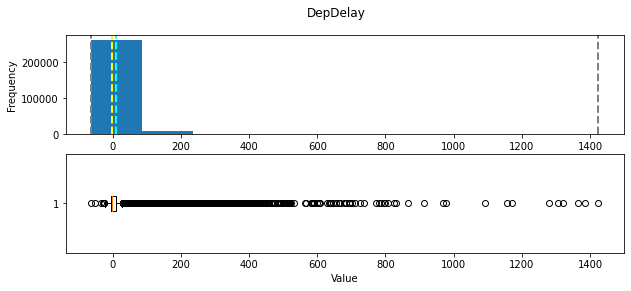

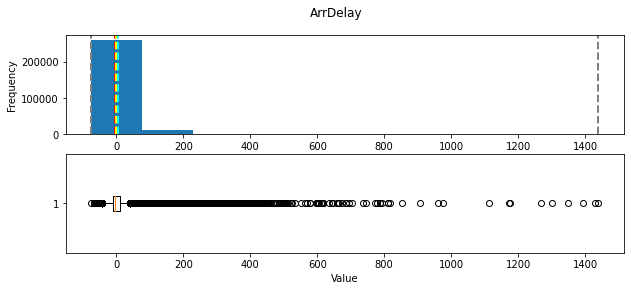

In [25]:
# Call the function for each delay field
delayFields = ['DepDelay', 'ArrDelay']
for col in delayFields:
    show_distribution(df_flights[col])

There are a outliers at the lower and upper ends of both variables - particularly at the upper end.

Let's trim the data so that we include only rows where the values for these fields are within the 1st and 90th percentile.

In [26]:
# Trim outliers for ArrDelay based on 1% and 90% percentiles
ArrDelay_01pcntile = df_flights.ArrDelay.quantile(0.01)
ArrDelay_90pcntile = df_flights.ArrDelay.quantile(0.90)
print(f'1% percentile is  {ArrDelay_01pcntile} \n90% percentile is {ArrDelay_90pcntile}')

1% percentile is  -33.0 
90% percentile is 38.0


-33 is at 1% while 38 is at 90% of the data

In [27]:
df_flights.shape

(271940, 20)

In [28]:
df_flights = df_flights[df_flights.ArrDelay < ArrDelay_90pcntile]
df_flights = df_flights[df_flights.ArrDelay > ArrDelay_01pcntile]

In [29]:
df_flights.shape

(241916, 20)

In [30]:
# Trim outliers for DepDelay based on 1% and 90% percentiles
DepDelay_01pcntile = df_flights.DepDelay.quantile(0.01)
DepDelay_90pcntile = df_flights.DepDelay.quantile(0.90)
df_flights = df_flights[df_flights.DepDelay < DepDelay_90pcntile]
df_flights = df_flights[df_flights.DepDelay > DepDelay_01pcntile]

DepDelay 
Minimum:-11.00
Mean:-0.92
Median:-2.00
Mode:-3.00
Maximum:16.00



C:\Users\aduzo\Anaconda3\lib\site-packages\ipykernel_launcher.py:39: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.


ArrDelay 
Minimum:-32.00
Mean:-5.03
Median:-6.00
Mode:0.00
Maximum:37.00



C:\Users\aduzo\Anaconda3\lib\site-packages\ipykernel_launcher.py:39: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.


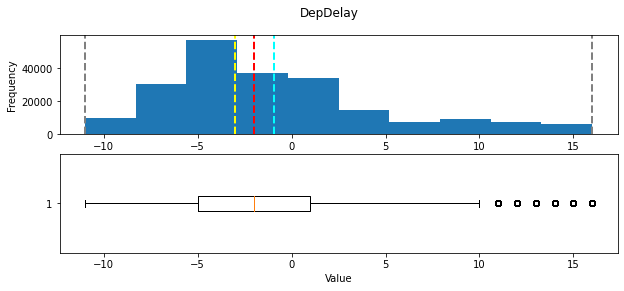

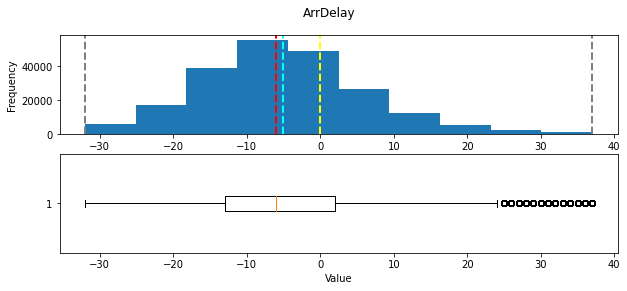

In [31]:
# View the revised distributions
for col in delayFields:
    show_distribution(df_flights[col])

In [32]:
df_flights.shape

(214397, 20)

That looks a bit better

2. Explore the cleaned data.
    - View summary statistics for the numeric fields in the dataset.
    - Determine the distribution of the **DepDelay** and **ArrDelay** columns.
    - Use statistics, aggregate functions, and visualizations to answer the following questions:
        - *What are the average (mean) departure and arrival delays?*
        - *How do the carriers compare in terms of arrival delay performance?*
        - *Are some days of the week more prone to arrival days than others?*
        - *Which departure airport has the highest average departure delay?*
        - *Do **late** departures tend to result in longer arrival delays than on-time departures?*
        - *Which route (from origin airport to destination airport) has the most **late** arrivals?*
        - *Which route has the highest average arrival delay?*

### Explore the data

Let's  start with an overall view of the summary statistics for the numeric columns.

In [33]:
df_flights.describe()

,Year,Month,DayofMonth,DayOfWeek,OriginAirportID,DestAirportID,CRSDepTime,DepDelay,DepDel15,CRSArrTime,ArrDelay,ArrDel15,Cancelled
count,214397.0,214397.000000,214397.000000,214397.000000,214397.000000,214397.000000,214397.000000,214397.000000,214397.000000,214397.000000,214397.000000,214397.000000,214397.000000
mean,2013.0,7.018368,15.794703,3.902737,12757.827661,12726.276147,1278.223879,-0.921692,0.018116,1461.406596,-5.030276,0.068602,0.013228
std,0.0,2.006398,8.859118,1.997744,1510.058629,1506.251757,469.440262,5.708594,0.133371,485.676457,11.424280,0.252776,0.114249
min,2013.0,4.000000,1.000000,1.000000,10140.000000,10140.000000,1.000000,-11.000000,0.000000,1.000000,-32.000000,0.000000,0.000000
25%,2013.0,5.000000,8.000000,2.000000,11292.000000,11292.000000,850.000000,-5.000000,0.000000,1054.000000,-13.000000,0.000000,0.000000
50%,2013.0,7.000000,16.000000,4.000000,12892.000000,12892.000000,1235.000000,-2.000000,0.000000,1445.000000,-6.000000,0.000000,0.000000
75%,2013.0,9.000000,23.000000,6.000000,14100.000000,14057.000000,1655.000000,1.000000,0.000000,1845.000000,2.000000,0.000000,0.000000
max,2013.0,10.000000,31.000000,7.000000,15376.000000,15376.000000,2359.000000,16.000000,1.000000,2359.000000,37.000000,1.000000,1.000000


In [34]:
delayFields

['DepDelay', 'ArrDelay']

What are the mean departure and arrival delays?

In [35]:
df_flights[delayFields].mean()

DepDelay   -0.921692
ArrDelay   -5.030276
dtype: float64

How do the carriers compare in terms of arrival delay performance?

In [36]:
df_flights.Carrier.unique()

array(['DL', 'WN', 'AS', 'EV', 'AA', 'OO', 'US', 'UA', 'FL', 'B6', 'VX',
       'MQ', '9E', 'YV', 'F9', 'HA'], dtype=object)

In [39]:
print(f'{len(df_flights.Carrier.unique())} unique Carriers')

16

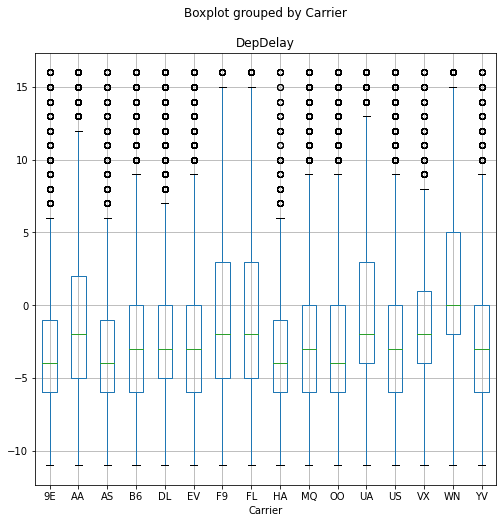

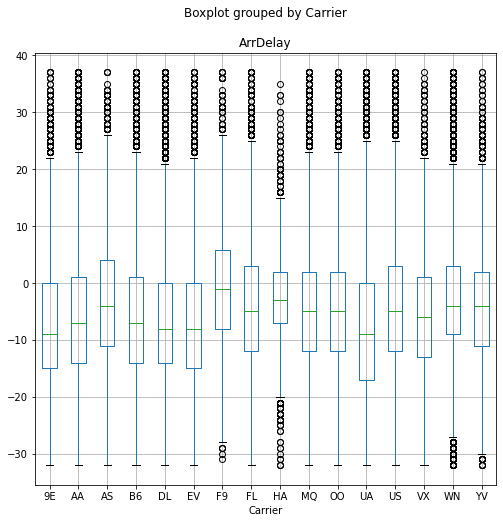

In [40]:
for col in delayFields:
    df_flights.boxplot(column=col, by='Carrier', figsize=(8,8))

As seen above,for DepDelay most carriers has mean with no delay or departs earlier on average thus no delay, but delays occurs, but in some instances, departure was delayed by more than 5 minutes.
Carriers such as 9E,AS,HA 75% of their times departs earlier than slated time.

For ArrDelay All carriers Arrive on time on the average.

Are some days of the week more prone to arrival days than others?

In [42]:
df_flights.DayOfWeek.unique() 

array([1, 6, 4, 7, 2, 5, 3], dtype=int64)

**DayOfWeek**: The day of the week on which the flight departed - from 1 (Monday) to 7 (Sunday)

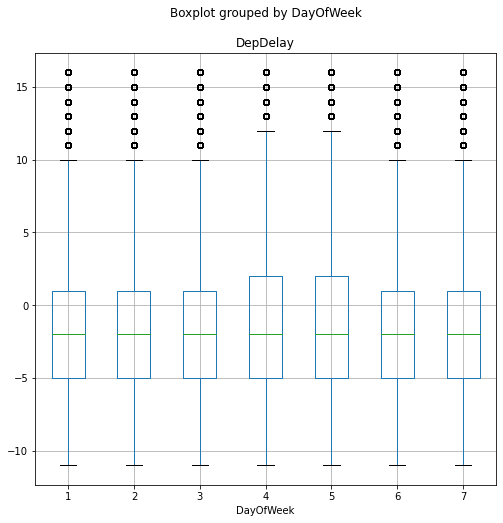

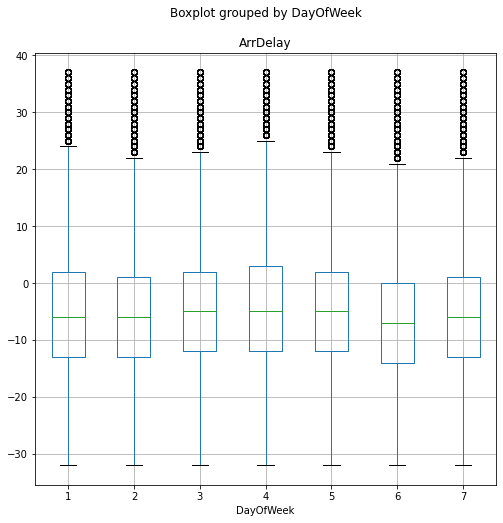

In [41]:
for col in delayFields:
    df_flights.boxplot(column=col, by='DayOfWeek', figsize=(8,8))

All days of the week has on average same arrival time. But Thursday is slighly more prone, but this is negligible.

Which departure airport has the highest average departure delay?

In [44]:
print(f'There are {len(df_flights.OriginAirportName.unique())} departure airports')

There are 70 departure airports


,DepDelay
OriginAirportName,
Chicago Midway International,2.365960
Dallas Love Field,2.148798
William P Hobby,1.561927
Metropolitan Oakland International,0.964853
Denver International,0.807272
...,...
Memphis International,-2.962737
Tucson International,-2.989154
Ted Stevens Anchorage International,-3.149758


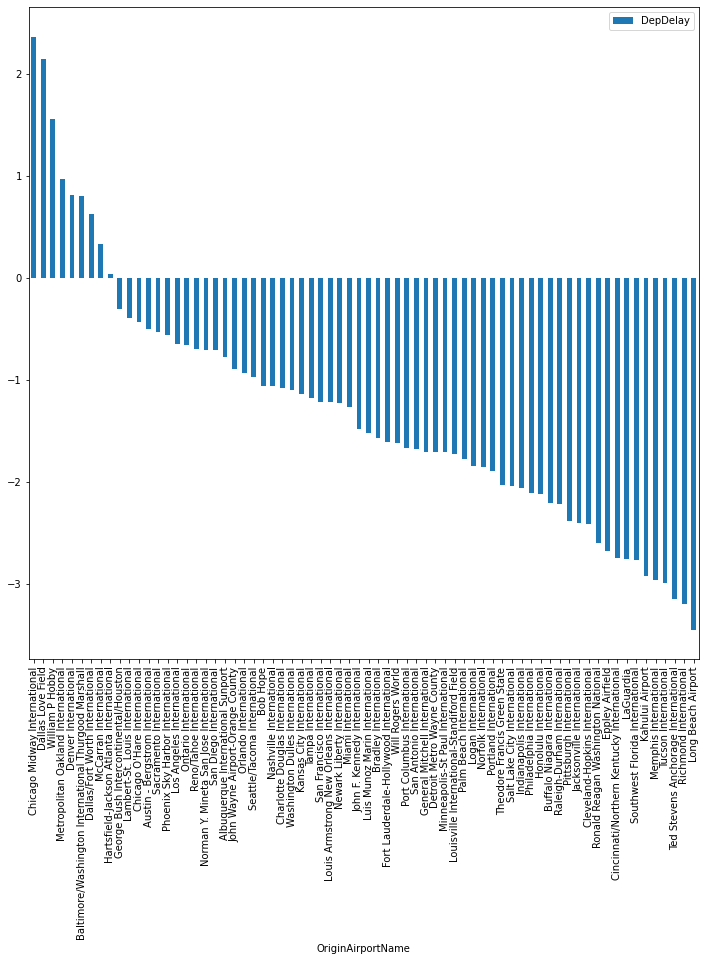

In [45]:
departure_airport_group = df_flights.groupby(df_flights.OriginAirportName)

mean_departure_delays =pd.DataFrame(departure_airport_group['DepDelay'].mean()).sort_values('DepDelay', ascending=False)
mean_departure_delays.plot(kind = 'bar', figsize=(12,12))
mean_departure_delays

Do late departures tend to result in longer arrival delays than on-time departures?

In [47]:
df_flights.DepDel15.unique()

array([0., 1.])

 0 if no delay by 15 minutes or more, 1 if so

<AxesSubplot:title={'center':'ArrDelay'}, xlabel='DepDel15'>

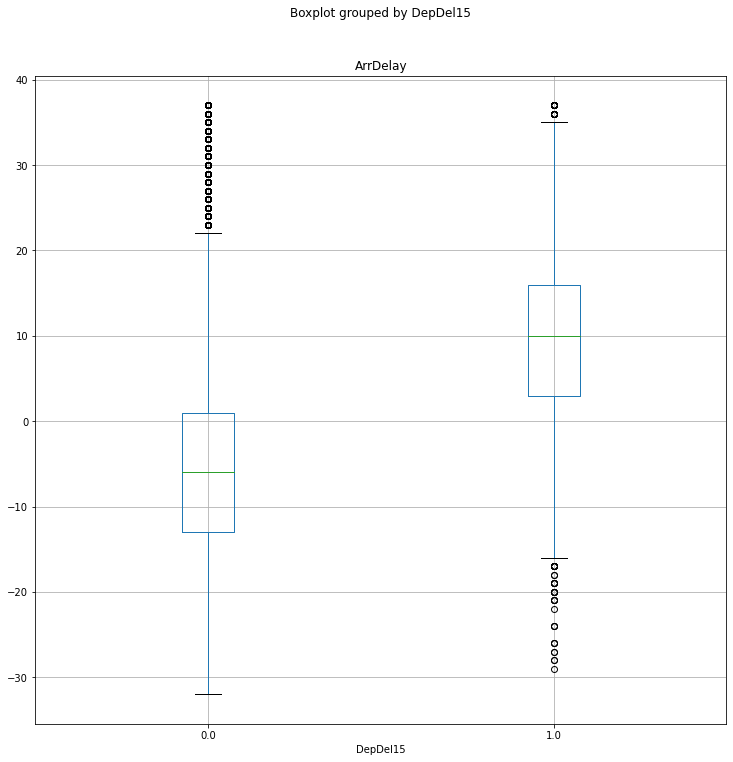

In [50]:
df_flights.boxplot(column='ArrDelay', by='DepDel15', figsize=(12,12))

Yes as seen in the above box plot, 

In [51]:
df_flights.groupby(by='DepDel15').ArrDelay.mean()

DepDel15
0.0   -5.299464
1.0    9.559732
Name: ArrDelay, dtype: float64

As seen from the above graph, late depareture influences arrival time as shown in there mean, early depature arrives 5 minutes earlier on average, while late departure arrives 10 minutes later than scheduled. 

Which route (from origin airport to destination airport) has the most late arrivals?

> Note: no column named route, rather there is Origin and Destination columns, so route is by combining these two columns.

In [52]:
df_flights.columns

Index(['Year', 'Month', 'DayofMonth', 'DayOfWeek', 'Carrier',
       'OriginAirportID', 'OriginAirportName', 'OriginCity', 'OriginState',
       'DestAirportID', 'DestAirportName', 'DestCity', 'DestState',
       'CRSDepTime', 'DepDelay', 'DepDel15', 'CRSArrTime', 'ArrDelay',
       'ArrDel15', 'Cancelled'],
      dtype='object')

In [53]:
# Add a routes column

routes = pd.Series(df_flights['OriginAirportName']+ '->'+df_flights['DestAirportName'])
df_flights = pd.concat([df_flights, routes.rename("Route")], axis=1)

# Group by routes
route_group = df_flights.groupby(df_flights.Route)
pd.DataFrame(route_group['ArrDel15'].sum()).sort_values('ArrDel15',ascending=False)

,ArrDel15
Route,
San Francisco International->Los Angeles International,90
Los Angeles International->San Francisco International,69
LaGuardia->Hartsfield-Jackson Atlanta International,68
Los Angeles International->John F. Kennedy International,52
LaGuardia->Charlotte Douglas International,51
...,...
Logan International->Austin - Bergstrom International,0
Logan International->Memphis International,0
Logan International->Port Columbus International,0


Which route has the highest average arrival delay?

In [54]:
pd.DataFrame(route_group['ArrDelay'].mean()).sort_values('ArrDelay', ascending=False)

,ArrDelay
Route,
Louis Armstrong New Orleans International->Ronald Reagan Washington National,24.500000
Cleveland-Hopkins International->Palm Beach International,18.000000
John F. Kennedy International->Louisville International-Standiford Field,18.000000
Cleveland-Hopkins International->Philadelphia International,12.800000
Memphis International->Denver International,9.758621
...,...
Lambert-St. Louis International->Cleveland-Hopkins International,-20.000000
Eppley Airfield->LaGuardia,-20.750000
Denver International->Kahului Airport,-22.666667
